# QBITS Basic Utility

##  Sesion 7_2 Six Compass Variational Quantum Eigensolver VQE

### UDL + 5E Model — Duration: 2 hours

---

## 1 Engage — Compasses in a Magnetic Field

> “Imagine six tiny compasses placed on a table, all inside the same uniform magnetic field.
>  
> The field tries to align every compass toward North.
>  
> But each compass also feels its neighbors, gently pulling them to align together.
>  
> If we shake the table slightly, the compasses wobble…
>  
> **Where will they finally settle?**”

This question introduces a key physical idea:

> **A system does not choose randomly — it relaxes toward minimum energy.**

**Guiding Questions:**
- What does it mean for a system to be “stable”?
- Can local interactions change a global alignment?
- How does a system decide when it has “settled”?

**Learning Objective:**  
Develop an intuitive understanding of energy minimization as a physical process, preparing for Variational Quantum Eigensolvers (VQE).

---


##  2 Explore — Competing Influences

We now identify **two competing effects** acting on our compasses (qubits):

### 1. External Magnetic Field
- Each compass wants to align with the field.
- In quantum terms, this favors the state $|0\rangle$.
- Energy contribution:  
$$
- Z_i
$$

### 2. Weak Interaction Between Neighbors
- Neighboring compasses prefer to align with each other.
- This influence is weaker than the field.
- Energy contribution:  
$$
- J Z_i Z_j \quad \text{with } J \ll 1
$$

**Key Exploration Question:**
> What happens when the field and the interactions do not perfectly agree?

---


## 3 Explain — The Physical Hamiltonian

We describe the system using an **Ising-like Hamiltonian**:

$$
H = - \sum_{i=1}^{N} Z_i \;-\; J \sum_{\langle i,j \rangle} Z_i Z_j
$$

### Meaning of Each Term

- $\sum Z_i$  
  → Alignment with the external field  
- $\sum Z_i Z_j$  
  → Alignment between neighboring compasses  
- $J \ll 1$  
  → The field dominates, but correlations matter

### Geometry (6 Qubits, Linear Chain)

$$
(0) — (1) — (2) — (3) — (4) — (5)
$$

Explicitly:

$$
\begin{aligned}
H = &- (Z_0 + Z_1 + Z_2 + Z_3 + Z_4 + Z_5) \\
&- J (Z_0 Z_1 + Z_1 Z_2 + Z_2 Z_3 + Z_3 Z_4 + Z_4 Z_5)
\end{aligned}
$$

**Conceptual Insight:**  
The ground state is not chosen — it **emerges** from physical competition.

---


## 4 Elaborate — Interpreting the VQE Process (6 Quantum Compasses)

In this section, we interpret the results produced by the Variational Quantum Eigensolver (VQE),  
connecting the mathematical structure introduced earlier with the numerical and visual outcomes.

At this stage, no new formalism is introduced.  
Instead, we focus on **reading**, **interpreting**, and **connecting** the results.

---

### 4.1 Optimization as a Physical Relaxation Process

The VQE algorithm can be understood as a controlled relaxation of a quantum system.

- A parametrized quantum circuit (ansatz) prepares a trial quantum state.
- The energy of this state is estimated.
- A classical optimizer updates the parameters to reduce the energy.
- The process repeats until convergence.

Although implemented numerically, this process mirrors the physical idea of a system  
seeking a low-energy configuration.

### 4.2 Physical Analogy (Compass Model)

- Each **qubit** represents a microscopic compass needle.
- The **external magnetic field** defines a preferred direction (the global “North”).
- Neighboring compasses interact weakly, trying to align with each other.
- The system seeks a configuration that **minimizes total energy**.

This creates a **competition**:
- Align with the field → lower single-spin energy  
- Align with neighbors → lower interaction energy  

VQE will help us find the **ground state** of this system.


In [98]:
# ============================================
# VQE: Weakly Coupled Spins (6 Qubits)
# ============================================

import numpy as np
import matplotlib.pyplot as plt
from qiskit import QuantumCircuit, transpile
# Import necessary Qiskit components for Hamiltonian definition and visualization
from qiskit.quantum_info import SparsePauliOp, Statevector 
from qiskit.visualization import plot_bloch_multivector, plot_state_qsphere
from qiskit_aer import AerSimulator
# Import EstimatorV2 primitive from Aer for local simulation of expectation values
from qiskit_ibm_runtime import EstimatorV2
from scipy.optimize import minimize # Import the classical optimizer

# --- Parameters ---
N = 6 # Number of qubits/spins
J = 0.2 # Coupling constant between adjacent spins
print("number Qubits",N)
print("Coupling Constant", J)


number Qubits 6
Coupling Constant 0.2


### 4.3 The Model Hamiltonian

The system is described by the Ising-type Hamiltonian:

$$
H = - \sum_{i=0}^{N-1} Z_i \;\;-\;\; J \sum_{i=0}^{N-2} Z_i Z_{i+1}
$$

This expression has **two distinct physical contributions**.

> External Field Term: $-Z_i$

Each term $-Z_i$ represents the interaction of a single compass with the **external magnetic field**.

- If the spin points **along the field** → lower energy
- If it points **against the field** → higher energy

In code, this is implemented by creating Pauli strings where:
- One qubit has a **Z operator**
- All others are **Identity (I)**
  
>Interaction Term: $-J Z_i Z_{i+1}$

-This term represents neighbor-to-neighbor coupling.
-Spins that align together reduce energy
-Misaligned neighbors cost energy
-The interaction is local and weak ($J \ll 1$)

>Assembling the Hamiltonian

All energy contributions are combined into a single operator:
> H = SparsePauliOp.from_list(pauli_terms)



In [102]:

# --- Build Hamiltonian (H = Sum(-Zi) + Sum(-J ZiZj)) ---
pauli_terms = []

# Field terms: -Zi (The effect of an external magnetic field on each spin)
for i in range(N):
    label = ["I"] * N # Start with all Identity operators
    label[i] = "Z"    # Set the operator for the current qubit to Z
    pauli_terms.append(("".join(label), -1.0)) # Add term to the list

# Interaction terms: -J ZiZj (The interaction energy between neighbors)
for i in range(N - 1):
    label = ["I"] * N
    label[i] = "Z"      # Z on the first neighbor (i)
    label[i + 1] = "Z"  # Z on the second neighbor (i+1)
    pauli_terms.append(("".join(label), -J)) # Add the interaction term to the list

H = SparsePauliOp.from_list(pauli_terms) # Compile all terms into a Qiskit Hamiltonian object

print(H)


SparsePauliOp(['ZIIIII', 'IZIIII', 'IIZIII', 'IIIZII', 'IIIIZI', 'IIIIIZ', 'ZZIIII', 'IZZIII', 'IIZZII', 'IIIZZI', 'IIIIZZ'],
              coeffs=[-1. +0.j, -1. +0.j, -1. +0.j, -1. +0.j, -1. +0.j, -1. +0.j, -0.2+0.j,
 -0.2+0.j, -0.2+0.j, -0.2+0.j, -0.2+0.j])


### 4.4 What an Ansatz Must Do

A good ansatz must:

- Reach many possible spin configurations
- Allow smooth, continuous adjustments
- Create correlations between neighboring spins
- Remain simple enough to optimize

This circuit satisfies all four.
>Each qubit receives a rotation:Theta

This means:

Each compass can tilt independently
The angle $\theta_i$ is a variational parameter
Classical optimization will tune these angles
This step “loosens” every compass, allowing it to explore different directions.

>Controlled-Z (CZ) gates introduce correlations between neighbors.

- They do not change probabilities directly
- They change relative phases
- These phases encode interaction energy>

>For Ising-type Hamiltonians ($Z_i Z_j$), CZ gates naturally reflect spin–spin coupling.
>Now each compass slightly reacts to its neighbor — they stop behaving independently.

In [104]:
# --- Ansatz (Trial Wavefunction Circuit) ---
def ansatz(params):
    """Generates the parameterizable quantum circuit (the trial state)."""
    qc = QuantumCircuit(N)
    for i in range(N):
        # Apply a variable Y-rotation (RY) to each qubit based on input parameters Move free
        qc.ry(params[i], i)
    for i in range(N - 1):
        # Apply Controlled-Z (CZ) gates to entangle neighbors (ideal for Ising model) "Entanglement"
        qc.cz(i, i + 1) 
    return qc

print(ansatz([0,0,0,0,0,0]))


     ┌───────┐               
q_0: ┤ Ry(0) ├─■─────────────
     ├───────┤ │             
q_1: ┤ Ry(0) ├─■──■──────────
     ├───────┤    │          
q_2: ┤ Ry(0) ├────■──■───────
     ├───────┤       │       
q_3: ┤ Ry(0) ├───────■──■────
     ├───────┤          │    
q_4: ┤ Ry(0) ├──────────■──■─
     ├───────┤             │ 
q_5: ┤ Ry(0) ├─────────────■─
     └───────┘               


### 4.5 Backend and Energy Evaluation (VQE Core)

In this block we connect the **quantum trial state** with a **numerical energy value**.
This is the bridge between quantum physics and classical optimization.

The quantum computer prepares a state  
The Hamiltonian evaluates its energy  
The classical optimizer decides the next move

Each compass configuration corresponds to a quantum state.
The Hamiltonian acts like a ruler that measures:
“How well aligned is this configuration with the field and with its neighbors?”
Lower energy means better alignment.

**Key elements to notice:**

• `AerSimulator`  
Provides a controllable quantum backend for local experiments.

• `EstimatorV2`  
Computes ⟨ψ(θ)|H|ψ(θ)⟩ without manual measurement circuits.

• `energy(params)`  
This is the function minimized by the classical optimizer.
Every VQE algorithm is built around this loop.





In [106]:
# --- Backend Configuration ---
backend = AerSimulator()
# Initialize the EstimatorV2 which calculates <H> using the simulator
estimator = EstimatorV2(mode=backend)

energy_history = [] # List to store energy values during optimization (for plotting)
params_history = [] # List to store params values during optimization (for plotting)

def energy(params):
    """
    The cost function for the VQE: calculates the expectation value of H.
    This function is minimized by the classical optimizer.
    """
    qc = ansatz(params)
    
    # Run the estimator job with the circuit, Hamiltonian, and no observable groups
    job = estimator.run([(qc, H, [])]) 
    # Extract the expectation value (the calculated energy) from the result
    value = job.result()[0]
    energy_history.append(value.data.evs) # Record energy for the convergence plot
    params_history.append(params.copy())
    return value.data.evs

print("Energy Params Function Loaded")


Energy Params Function Loaded


### 4.6 Classical Optimization: Shaking the Compasses

At this stage, the quantum system does **not** decide by itself.
Instead, we alternate between two roles:

• The **quantum circuit** prepares a trial configuration  
• The **classical optimizer** decides how to adjust it  

This back-and-forth process is the essence of the Variational Quantum Eigensolver (VQE).

Imagine six compasses placed in a weak magnetic field.

We start by shaking them randomly.
After each shake, we measure the total energy of the system.
If the energy decreases, we keep moving in that direction.

Eventually, the shaking stops — the compasses settle into equilibrium.

**What to focus on:**

• `initial_params`  
Represents the first random orientation of all compasses.

• `COBYLA`  
A gradient-free optimizer, well suited for noisy or shot-based evaluations.

• `energy(params)`  
Each call prepares a new quantum state and measures its energy.

• `result.x`  
The angles that best align the spins with the magnetic field and with each other.



--- Optimization Results ---
Minimum Energy: -6.9993
Optimal Parameters: [ 1.07842591e-02  5.67159436e-02  4.58149913e-02 -1.98031584e-03
  6.28891149e+00  1.53425175e-02]


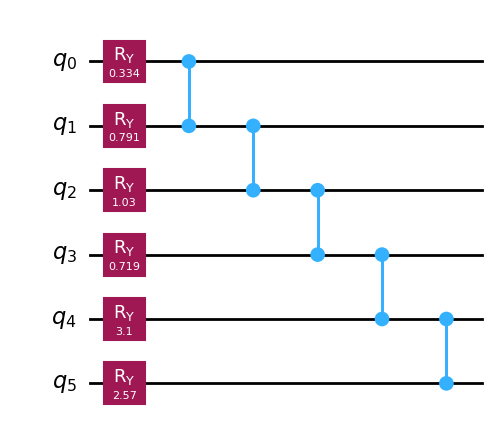

In [107]:
# --- Optimization ---
# Initialize parameters randomly between 0 and pi for a starting 'shake'
initial_params = np.random.uniform(0, np.pi, N)
qcp=ansatz(initial_params)
# Run the COBYLA optimization algorithm to find the minimum energy
result = minimize(energy, initial_params, method="COBYLA", tol=1e-3)

print("--- Optimization Results ---")
print(f"Minimum Energy: {result.fun:.4f}")
print(f"Optimal Parameters: {result.x}")
qcp.draw(output="mpl")

### 4.7 Convergence of the Variational Energy

The convergence plot shows how the estimated energy evolves during the optimization.

Key points to observe:

- The energy decreases as the optimizer explores the parameter space.
- Small oscillations reflect the balance between exploration and refinement.
- The final plateau indicates that a stable minimum has been reached.

Importantly, the algorithm does not “jump” directly to the solution.  
It gradually reshapes the trial state until no further improvement is found.


--- Optimization Results ---
Minimum Energy: -6.9993
Optimal Parameters: [ 1.07842591e-02  5.67159436e-02  4.58149913e-02 -1.98031584e-03
  6.28891149e+00  1.53425175e-02]


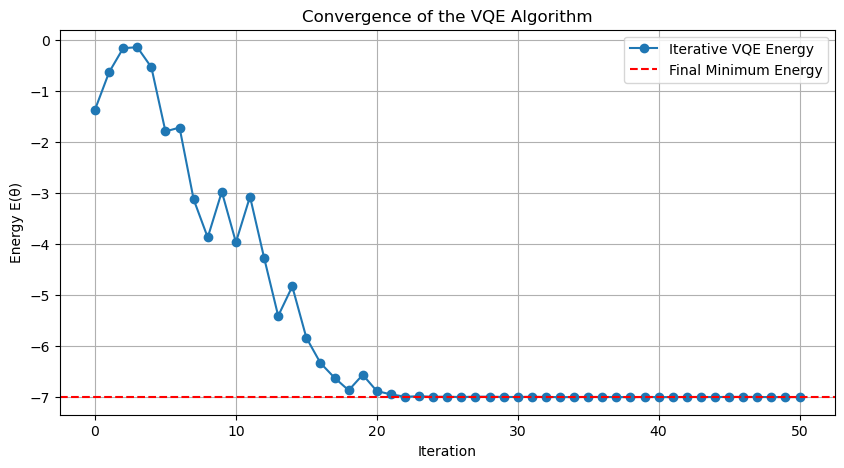

In [108]:
# ============================================
# VISUALIZATION ADDITIONS
# ============================================

print("--- Optimization Results ---")
print(f"Minimum Energy: {result.fun:.4f}")
print(f"Optimal Parameters: {result.x}")

# 1. Energy Convergence Plot (Tracking the optimization process)
plt.figure(figsize=(10, 5))
plt.plot(energy_history, label="Iterative VQE Energy", marker='o', linestyle='-')
plt.axhline(y=result.fun, color='r', linestyle='--', label="Final Minimum Energy")
plt.title("Convergence of the VQE Algorithm")
plt.xlabel("Iteration")
plt.ylabel("Energy E(θ)")
plt.legend()
plt.grid(True)
plt.show()


### 4.8 Trajectory in Parameter Space

The three-dimensional scatter plot represents a projection of the optimizer’s path  
through the variational parameter space.

Each point corresponds to:
- One evaluation of the trial state.
- One set of circuit parameters.
- One estimated energy value.

The color gradient encodes the energy, making visible how the optimizer  
is guided toward lower-energy regions.

This trajectory should be interpreted as a **path in an abstract space**,  
not as motion in physical space.


--- Optimization Results ---
Minimum Energy: -6.9993
Optimal Parameters: [ 1.07842591e-02  5.67159436e-02  4.58149913e-02 -1.98031584e-03
  6.28891149e+00  1.53425175e-02]


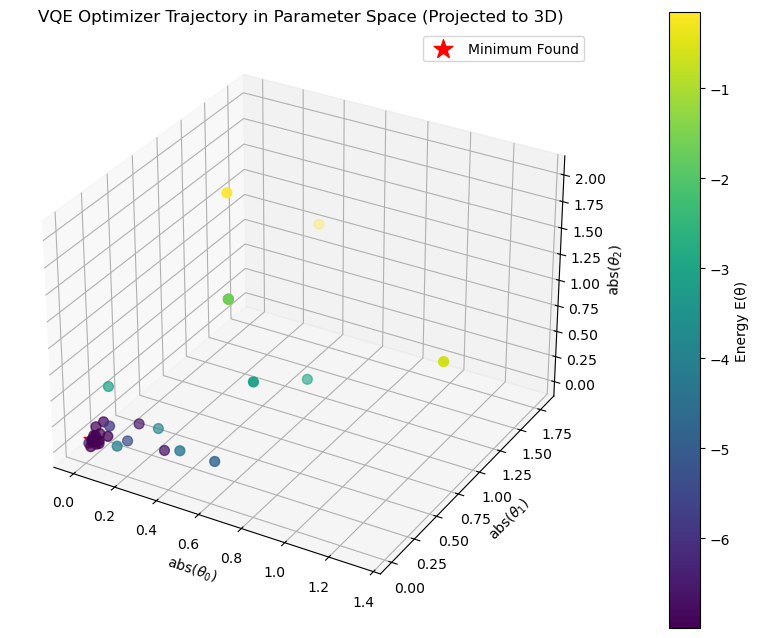

In [109]:
# ============================================
# STATIC 3D SCATTER PLOT
# ============================================

print("--- Optimization Results ---")
print(f"Minimum Energy: {result.fun:.4f}")
print(f"Optimal Parameters: {result.x}")

def plot_optimization_scatter(params_history, energy_history):
    # Convert parameter history list to a NumPy array for easier slicing
    history_abs = np.abs(params_history)
    
    # Take the first 3 absolute parameters as X, Y, Z coordinates for visualization
    X = history_abs[:, 0]
    Y = history_abs[:, 1]
    Z = history_abs[:, 2]
    # Convert energy history to a NumPy array
    E = np.array(energy_history)
     # Create a new Matplotlib figure and set up a 3D subplot axis
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    # Plot all optimization steps as a scatter plot
    # The 'c=E' maps the energy values to the 'viridis' color map
    scatter = ax.scatter(X, Y, Z, c=E, cmap='viridis', marker='o', s=50)
    
    # Add a color bar legend to interpret what the colors mean (Energy E(θ))
    plt.colorbar(scatter, pad=0.1, label='Energy E(θ)')

    # Mark the final point (minimum energy found) in red with a star marker
    ax.scatter(X[-1], Y[-1], Z[-1], color='red', s=200, marker='*', label='Minimum Found')

    # Set the title and axis labels using LaTeX notation for theta
    ax.set_title("VQE Optimizer Trajectory in Parameter Space (Projected to 3D)")
    ax.set_xlabel(' abs($\\theta_0$)')
    ax.set_ylabel(' abs($\\theta_1$)')
    ax.set_zlabel(' abs($\\theta_2$)')
    ax.legend() # Display the legend (showing the 'Minimum Found' label)
    plt.show() # Display the plot window

# Execute the static plot function
plot_optimization_scatter(params_history, energy_history)


### 4.9 Energy Landscape: An Effective View

To better understand the structure explored by the optimizer,  
we construct an interpolated energy surface.

This surface represents:
- A coarse-grained projection of the high-dimensional variational space.
- An effective energy landscape shaped by the chosen ansatz.

Important cautions:

- The true parameter space has higher dimension.
- The surface is an approximation, not the full landscape.
- Features such as valleys and plateaus still provide useful intuition.

This visualization helps explain why some regions guide the optimizer  
more efficiently than others.


In [110]:
import plotly.graph_objects as go
import numpy as np
from scipy.interpolate import griddata
# (Assume that your lists params_history and energy_history are populated from the VQE run)

print("--- Optimization Results ---")
print(f"Minimum Energy: {result.fun:.4f}")
print(f"Optimal Parameters: {result.x}")

def plot_interpolated_surface_components(params_history, energy_history):
    """
    Generates an interactive 3D surface plot visualizing the VQE energy landscape 
    by projecting the 6 parameters into two averaged components (X and Y), 
    and using Energy as the Z-axis height.
    """
    # Convert the list of parameter arrays into a single NumPy array for efficient slicing
    history_abs = np.abs(params_history)
    
    # X-axis component: Calculate the average absolute value of the first three parameters
    X_comp_points = np.mean(history_abs[:, 0:3], axis=1) 
    # Y-axis component: Calculate the average absolute value of the last three parameters
    Y_comp_points = np.mean(history_abs[:, 3:6], axis=1)
    # Z-axis/Color data: Flatten the energy history array into a 1D array of floats
    E_points = np.array(energy_history).flatten()

    # --- 1. Create a Structured Grid (Mesh) for the surface ---
    # Define the range of the X-axis for the visualization (slightly expanded min/max)
    xi = np.linspace(X_comp_points.min() * 0.9, X_comp_points.max() * 1.1, 1000)
    # Define the range of the Y-axis for the visualization (slightly expanded min/max)
    yi = np.linspace(Y_comp_points.min() * 0.9, Y_comp_points.max() * 1.1, 1000)
    
    # Create the 2D meshgrid from the linearized ranges (the X,Y coordinates of the surface)
    Xi, Yi = np.meshgrid(xi, yi)
    
    # --- 2. Interpolation ---
    # Use 'cubic' interpolation to smooth the scattered data points into a regular grid
    # Zi will be the interpolated ENERGY surface value at every [Xi, Yi] coordinate
    Zi = griddata((X_comp_points, Y_comp_points), E_points, (Xi, Yi), method='cubic')
    
    # --- 3. Plot the Surface with Plotly ---
    # Initialize a Plotly figure with a Surface trace
    fig = go.Figure(data=[go.Surface(
        x=xi,                  # Map the X-axis to our X component range
        y=yi,                  # Map the Y-axis to our Y component range
        z=Zi,                  # Map the Z-axis (height) to the interpolated energy values
        colorscale='Viridis',  # Use the 'Viridis' color map (cold=low energy, warm=high energy)
        colorbar_title='Energy E(θ)', # Label for the color bar
        opacity=0.9            # Set transparency level
    )])

    # Update the layout for better presentation and size
    fig.update_layout(
        title='Interpolated Energy Surface (Components X/Y vs. Energy Z)',
        width=1000,            # Set the width of the plot container
        height=800,            # Set the height of the plot container
        scene=dict(            # Configure the 3D scene labels
            xaxis_title='Avg(abs($\\theta_0,\\theta_1,\\theta_2$))',
            yaxis_title='Avg(abs($\\theta_3,\\theta_4,\\theta_5$))',
            zaxis_title='Energy E($\\theta$)' 
        )
    )
    
    # Display the interactive plot (allows rotation/zoom in the browser/notebook)
    fig.show()

# --- Execute the interpolated surface visualization function ---
# Ensure this code runs AFTER your main VQE optimization block where params_history is populated
plot_interpolated_surface_components(params_history, energy_history)

--- Optimization Results ---
Minimum Energy: -6.9993
Optimal Parameters: [ 1.07842591e-02  5.67159436e-02  4.58149913e-02 -1.98031584e-03
  6.28891149e+00  1.53425175e-02]


### 4.10 Final Quantum State: Local Projections of a Global State

After convergence, the algorithm returns a single quantum state  
that approximates the ground state of the system.

To interpret this result, we visualize the final state using  
single-qubit Bloch sphere projections.

Each Bloch sphere shows:
- The reduced (local) state of one qubit.
- A partial view of the full quantum state.

Crucially:
- No single Bloch sphere contains the full information.
- Correlations and entanglement are not fully visible locally.
- The global state must be understood as a composite object.

This reinforces the idea introduced earlier:  
**the system is described by one shared quantum state, not by independent qubits.**


--- Optimization Results ---
Minimum Energy: -6.9993
Optimal Parameters: [ 1.07842591e-02  5.67159436e-02  4.58149913e-02 -1.98031584e-03
  6.28891149e+00  1.53425175e-02]

--- Final State Visualization ---


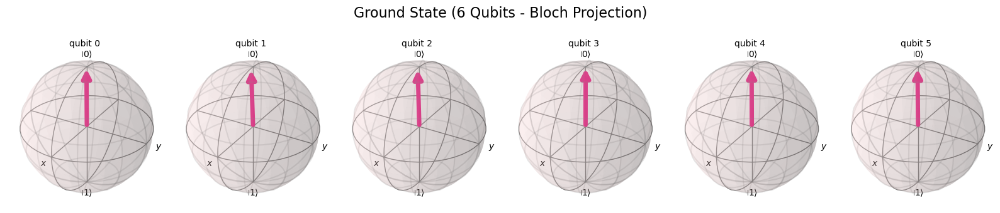

In [111]:
# 2. Bloch Spheres of the Final State (Per-qubit projection)
# Rebuild the final optimized circuit using the optimal parameters found by scipy

print("--- Optimization Results ---")
print(f"Minimum Energy: {result.fun:.4f}")
print(f"Optimal Parameters: {result.x}")

optimal_params = result.x
final_ansatz = ansatz(optimal_params)

# Obtain the full Statevector for visualization
final_statevector = Statevector(final_ansatz)

print("\n--- Final State Visualization ---")

# Display the 6 Bloch spheres, showing individual 'compass' orientations
display(plot_bloch_multivector(
    final_statevector,
    title="Ground State (6 Qubits - Bloch Projection)"
))

## 4.11 Conceptual Closure

The VQE does not produce a list of independent qubit states.  
It produces a **single optimized quantum state**, whose properties can be explored  
through complementary visualizations.

- Convergence reveals *how* the solution is found.
- Parameter trajectories reveal *where* the optimizer moves.
- Energy landscapes reveal *why* certain regions are stable.
- Bloch projections reveal *how the global state appears locally*.

Together, these perspectives complete the transition  
from abstract quantum states to physically interpretable results.


## 5 Evaluate — What Did the Compasses Do?

**Reflection Questions:**
- Did all qubits align perfectly with the field?
- Where do correlations appear?
- How does changing $J$ affect convergence?

**Key Pedagogical Message:**

> VQE does not search bitstrings.  
> It allows a physical system to *relax* toward equilibrium.

### Compare with QAOA

| Aspect | VQE | QAOA |
|------|-----|------|
| Interpretation | Physical relaxation | Discrete optimization |
| Cost | Hamiltonian energy | Bitstring objective |
| Intuition | Spins and fields | Paths and choices |

**Takeaway:**  
VQE is the *continuous, physical cousin* of QAOA — and often easier to understand first.

---
